# CMAPS Jet Engine failure prediction 

## Problem Statement:

Prognostics and Health Management (PHM) is a crucial field in industry for predicting asset conditions, preventing failures and unplanned downtime. This dataset, derived from a well-known NASA public dataset, is widely used for asset degradation modeling. 
It contains run-to-failure simulated data from turbofan jet engines.

<img src="Turbofan.png" width="" align="" />

## Prediction Goal

Originally, the dataset was intended for predicting the Remaining Useful Life (RUL) of each engine, providing an estimate of the number of remaining cycles before failure.
However, I have converted this regression problem into a classification task to simplify decision-making in predictive maintenance. To achieve this, I applied a threshold-based approach to RUL values, defining two distinct classes:

- Class 0: The engine is operating normally and is not in a critical state.

- Class 1: The engine is approaching failure, requiring immediate maintenance actions.

The objective is to develop a model that can accurately classify the engine’s condition based on the available sensor data. This approach makes it easier to implement predictive maintenance strategies by providing a clear indication of when an engine needs attention.

## Experimental Scenario

The dataset consists of multiple multivariate time series, each representing the operation of a different engine, all belonging to the same fleet. Every engine starts in a normal operational state and degrades over time until failure.

Since operating conditions vary and significantly affect engine performance, the dataset includes three variables that describe these conditions. Additionally, sensor noise is present in the data, making classification more challenging

The classification model must therefore learn to differentiate between normal and critical engine conditions, despite variability in operating environments and sensor measurements.

## Dataset

The dataset used in this project is publicly available and widely used for research in predictive maintenance and prognostics. It contains simulated run-to-failure data for turbofan jet engines and was developed by the NASA Ames Research Center.

It can be downloaded from the following sources:

- Kaggle: https://www.kaggle.com/code/wassimderbel/nasa-predictive-maintenance-rul/notebook

- NASA Site: https://data.nasa.gov/Aerospace/CMAPSS-Jet-Engine-Simulated-Data/ff5v-kuh6/about_data

# Importing libraries

In [ ]:
# === Basic Libraries ===
import pandas as pd
import numpy as np
import itertools
import warnings

# === Machine Learning - Preprocessing and Transformations ===
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import FunctionTransformer, StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.feature_selection import mutual_info_regression, SelectKBest, SequentialFeatureSelector as SFS
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# === Machine Learning - Classification and Regression Models ===
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.multiclass import OneVsOneClassifier, OneVsRestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# === Machine Learning - Evaluation and Metrics ===
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.model_selection import (
    train_test_split, KFold, StratifiedKFold, RepeatedStratifiedKFold, 
    cross_val_score, cross_validate, GridSearchCV, RandomizedSearchCV, learning_curve, validation_curve
)

# === Pipelines and Advanced Transformations ===
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as IMBPipeline

# === Statistics and Distributions ===
from scipy.stats import loguniform, beta, uniform

# === Data Visualization ===
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# === Ignore Warnings ===
warnings.filterwarnings('ignore')


# Extract Information from Training Data

## Load data

Defining the column names for the dataset
 - index_names: contains the unit number and the number of operational cycles
 - setting_names: represents three operational settings of the machine
 - sensor_names: includes the names of the sensors that monitor various machine parameters

In [ ]:
index_names = ['unit_number', 'time_cycles']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = ['T2','T24','T30','T50','P2','P15','P30','Nf','Nc','epr','Ps30','phi','NRf','NRc','BPR','farB','htBleed','Nf_dmd','PCNfR_dmd','W31','W32']
col_names = index_names + setting_names + sensor_names

Reading the training dataset from a txt file and converting it into a pandas DataFrame
 - The file is space-separated ('\s+')
 - It does not have column headers, so manually defined names from col_names are assigned
 - The dataset is loaded into df_train

In [ ]:
df_train=pd.read_csv('data/train_FD001.txt',sep='\s+',header=None,index_col=False,names=col_names)
print('Shape of train dataset',df_train.shape)

Shape of train dataset (20631, 26)


In [ ]:
df_train

,unit_number,time_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


## Explore Dataset

Displaying general information about the dataset.
Provides an overview of the DataFrame, including the number of entries, column names, non-null counts, and data types for each column.

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   unit_number  20631 non-null  int64  
 1   time_cycles  20631 non-null  int64  
 2   setting_1    20631 non-null  float64
 3   setting_2    20631 non-null  float64
 4   setting_3    20631 non-null  float64
 5   T2           20631 non-null  float64
 6   T24          20631 non-null  float64
 7   T30          20631 non-null  float64
 8   T50          20631 non-null  float64
 9   P2           20631 non-null  float64
 10  P15          20631 non-null  float64
 11  P30          20631 non-null  float64
 12  Nf           20631 non-null  float64
 13  Nc           20631 non-null  float64
 14  epr          20631 non-null  float64
 15  Ps30         20631 non-null  float64
 16  phi          20631 non-null  float64
 17  NRf          20631 non-null  float64
 18  NRc          20631 non-null  float64
 19  BPR 

Checking for missing values in the dataset

In [ ]:
df_train.isnull().sum()

unit_number    0
time_cycles    0
setting_1      0
setting_2      0
setting_3      0
T2             0
T24            0
T30            0
T50            0
P2             0
P15            0
P30            0
Nf             0
Nc             0
epr            0
Ps30           0
phi            0
NRf            0
NRc            0
BPR            0
farB           0
htBleed        0
Nf_dmd         0
PCNfR_dmd      0
W31            0
W32            0
dtype: int64

### Make some noise

Since the dataset comes from a MATLAB simulation, I added some noise to it. 
Specifically, I introduced NaN values and noise in the 21st column, which corresponds to sensor data that will be recorded in real-time by the aircraft controller.

In [ ]:
#function for make some noise
def make_noise(data,perc_nan,perc_noise,noise_level,cols, seed=42):
    # Define columns to add noise
    tmpdata = data.copy()
    columns_to_noise = tmpdata.columns[cols:]
    num_rows, num_cols = tmpdata.shape

    # Calculate the number of NaN points to introduce
    num_nan_points = int(perc_nan * num_rows * len(columns_to_noise))

    # Calculate the number of noisy points to introduce
    num_noisy_points = int(perc_noise * num_rows * len(columns_to_noise))

    # Set the random seed for reproducibility
    np.random.seed(seed)
    
    # Randomly select rows and columns to introduce NaN
    random_nan_rows = np.random.choice(tmpdata.index, num_nan_points, replace=True)
    random_nan_cols = np.random.choice(columns_to_noise, num_nan_points, replace=True)
    
    # Randomly select rows and columns to introduce noisy values
    random_noisy_rows = np.random.choice(tmpdata.index, num_noisy_points, replace=True)
    random_noisy_cols = np.random.choice(columns_to_noise, num_noisy_points, replace=True)

    # Introduce NaN values in the dataset
    for row, col in zip(random_nan_rows, random_nan_cols):
        tmpdata.at[row, col] = np.nan

    # Introduce noisy values in the dataset
    for row, col in zip(random_noisy_rows, random_noisy_cols):
        tmpdata.at[row, col] += np.random.normal(0, noise_level)
    return tmpdata

In [ ]:
# Define the percentage of NaN values to introduce
perc_nan=0.01

# Define the percentage of noisy values to introduce
perc_noise=0.05

# Define the noise level (magnitude of noise)
noise_level=0.03

# Add noise to the dataset
df_train_noise=make_noise(df_train,perc_nan,perc_noise,noise_level,5)

After adding some noise to the dataset, we can visualize the missing values using the missingno library. 
Specifically, the matrix method allows us to plot where the missing values are located in the feature matrix.

<AxesSubplot: >

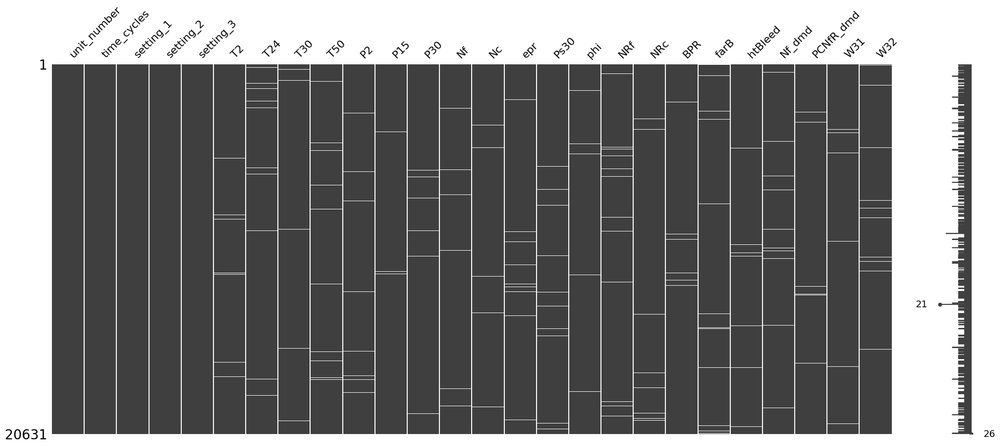

In [ ]:
msno.matrix(df_train_noise)

In [ ]:
df_train_noise.describe()

,unit_number,time_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
count,20631.000000,20631.000000,20631.000000,20631.000000,20631.0,20443.000000,20420.000000,20435.000000,20436.000000,20433.000000,...,20412.000000,20406.000000,20436.000000,20428.000000,20409.000000,20412.000000,20410.000000,20438.000000,20421.000000,20444.000000
mean,51.506568,108.807862,-0.000009,0.000002,100.0,518.669970,642.680453,1590.521682,1408.932616,14.620062,...,521.414556,2388.096052,8143.754018,8.442184,0.030040,393.209595,2388.000083,99.999964,38.816209,23.289747
std,29.227633,68.880990,0.002187,0.000293,0.0,0.006496,0.500226,6.130558,8.996524,0.006768,...,0.737309,0.072254,19.090455,0.038103,0.006787,1.550451,0.006493,0.006640,0.180917,0.108453
min,1.000000,1.000000,-0.008700,-0.000600,100.0,518.573841,641.210000,1571.040000,1382.250000,14.487280,...,518.690000,2387.880000,8099.940000,8.315315,-0.096227,388.000000,2387.907877,99.905764,38.140000,22.894200
25%,26.000000,52.000000,-0.001500,-0.000200,100.0,518.670000,642.320000,1586.260000,1402.365854,14.620000,...,520.960000,2388.040000,8133.257500,8.414800,0.030000,392.000000,2388.000000,100.000000,38.700000,23.221600
50%,52.000000,104.000000,0.000000,0.000000,100.0,518.670000,642.640000,1590.100000,1408.030000,14.620000,...,521.480000,2388.090000,8140.525000,8.438900,0.030000,393.000000,2388.000000,100.000000,38.830000,23.297900
75%,77.000000,156.000000,0.001500,0.000300,100.0,518.670000,643.000000,1594.384178,1414.550000,14.620000,...,521.950000,2388.140000,8148.302500,8.465900,0.030000,394.000000,2388.000000,100.000000,38.950000,23.366900
max,100.000000,362.000000,0.008700,0.000600,100.0,518.772684,644.530000,1616.910000,1441.490000,14.712925,...,523.380000,2388.560000,8293.720000,8.586162,0.134257,400.000000,2388.113287,100.089632,39.430000,23.636331


In the pipeline, i need to define a strategy to fill the missing values, which may vary for each column.

# Data Visualization & feature engineering

## Visualization

### Create a Dictionary for Sensor Parameters

I first define a dictionary to map sensor names to their corresponding physical parameters. This helps improve readability and interpretability in our dataset.

In [ ]:
Param_dictionary={}

# List of sensor parameters with their respective units
dict_list=[ "(Fan inlet temperature) (◦R)",
"(LPC outlet temperature) (◦R)",
"(HPC outlet temperature) (◦R)",
"(LPT outlet temperature) (◦R)",
"(Fan inlet Pressure) (psia)",
"(bypass-duct pressure) (psia)",
"(HPC outlet pressure) (psia)",
"(Physical fan speed) (rpm)",
"(Physical core speed) (rpm)",
"(Engine pressure ratio(P50/P2)",
"(HPC outlet Static pressure) (psia)",
"(Ratio of fuel flow to Ps30) (pps/psia)",
"(Corrected fan speed) (rpm)",
"(Corrected core speed) (rpm)",
"(Bypass Ratio) ",
"(Burner fuel-air ratio)",
"(Bleed Enthalpy)",
"(Required fan speed (rpm))",
"(Required fan conversion speed (rpm))",
"(High-pressure turbines Cool air flow (lbm/s))",
"(Low-pressure turbines Cool air flow (lbm/s))" ]

# Define settings parameters
Param_dictionary["setting_1"]="setting_1"
Param_dictionary["setting_2"]="setting_2"
Param_dictionary["setting_3"]="setting_3"

# Map sensor names to dictionary list
for x,y in zip(sensor_names,dict_list ):
    Param_dictionary[x]=y

Param_dictionary

{'setting_1': 'setting_1',
 'setting_2': 'setting_2',
 'setting_3': 'setting_3',
 'T2': '(Fan inlet temperature) (◦R)',
 'T24': '(LPC outlet temperature) (◦R)',
 'T30': '(HPC outlet temperature) (◦R)',
 'T50': '(LPT outlet temperature) (◦R)',
 'P2': '(Fan inlet Pressure) (psia)',
 'P15': '(bypass-duct pressure) (psia)',
 'P30': '(HPC outlet pressure) (psia)',
 'Nf': '(Physical fan speed) (rpm)',
 'Nc': '(Physical core speed) (rpm)',
 'epr': '(Engine pressure ratio(P50/P2)',
 'Ps30': '(HPC outlet Static pressure) (psia)',
 'phi': '(Ratio of fuel flow to Ps30) (pps/psia)',
 'NRf': '(Corrected fan speed) (rpm)',
 'NRc': '(Corrected core speed) (rpm)',
 'BPR': '(Bypass Ratio) ',
 'farB': '(Burner fuel-air ratio)',
 'htBleed': '(Bleed Enthalpy)',
 'Nf_dmd': '(Required fan speed (rpm))',
 'PCNfR_dmd': '(Required fan conversion speed (rpm))',
 'W31': '(High-pressure turbines Cool air flow (lbm/s))',
 'W32': '(Low-pressure turbines Cool air flow (lbm/s))'}

### Visualizing Maximum and Minimum Time Cycles in the Dataset

To understand the lifecycle of aircraft engines in the dataset, I analyze the maximum time cycles of each unit.

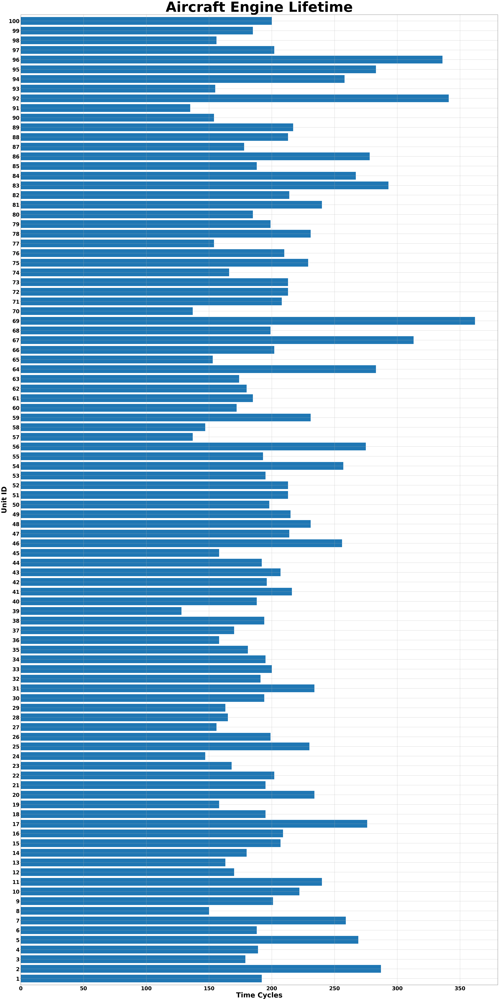

In [ ]:
# Compute the maximum time cycles for each unit
max_unit_time_cycles=df_train_noise[index_names].groupby('unit_number').max()

# Plot the maximum time cycles for each unit
plt.figure(figsize=(40,80))
ax=max_unit_time_cycles['time_cycles'].plot(kind='barh',width=.8,align='center')

# Customize plot aesthetics
plt.title('Aircraft Engine Lifetime',fontweight='bold',fontsize=80)
plt.ylabel('Unit ID',fontweight='bold',fontsize=40)
plt.yticks(fontweight='bold',fontsize=30)
plt.xlabel('Time Cycles',fontweight='bold',fontsize=40)
plt.xticks(fontweight='bold',fontsize=30)
plt.grid(True)
plt.tight_layout()
plt.show()

### Visualizing Time Cycle Distribution

To better understand how long engines typically last, I plot the distribution of time cycles across all units.

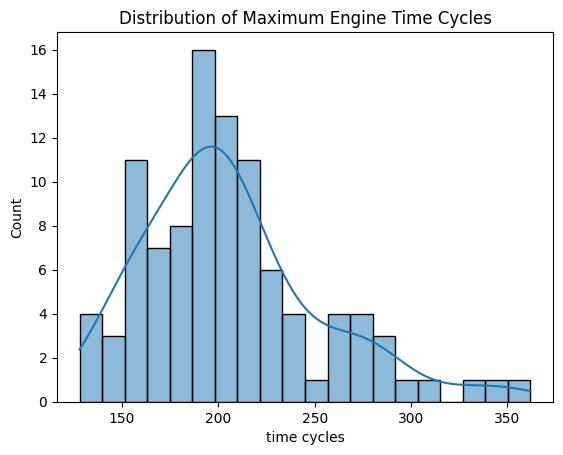

In [ ]:
# Histogram of time cycle distribution
sns.histplot(max_unit_time_cycles['time_cycles'],kde=True,bins=20)
plt.xlabel('time cycles')
plt.title('Distribution of Maximum Engine Time Cycles')
plt.show()

### Segmenting Engine Lifecycle into Two Classes: Good & Alert

I categorize engine life into two phases:

- Green Zone (Good Condition) – Engine operates normally. >= 30% of RUL

- Red Zone (Alert Condition) – Engine approaching failure. < 30% of RUL

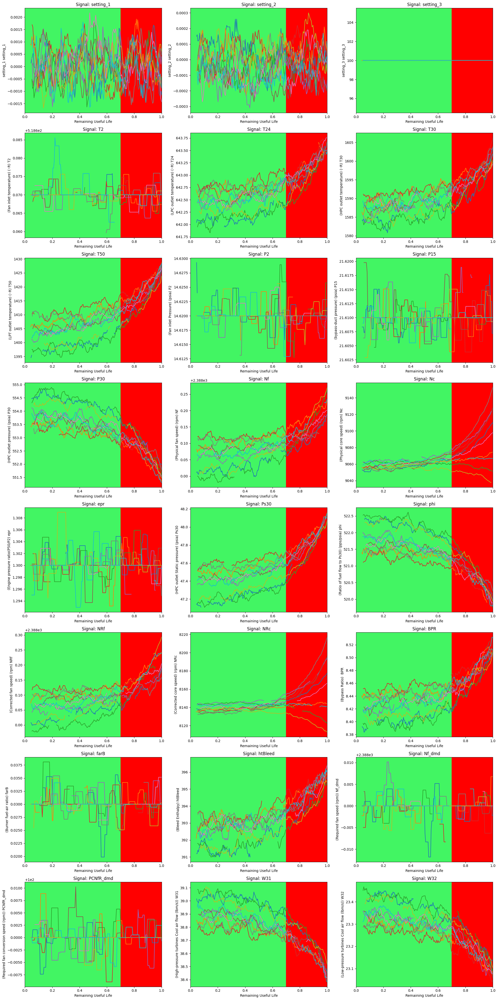

In [ ]:
# Define the segmentation threshold
x_range = 0.7 # Threshold for defining "Good" vs. "Alert" zone
num_plots = 3  # Number of plots per row
num_rows = (len(Param_dictionary) + num_plots - 1) // num_plots  

# Create subplots
fig, axes = plt.subplots(num_rows, num_plots, figsize=(20, num_rows * 5))
axes = axes.flatten()  
max_x = 1  

# Iterate through all parameters and plot their trends over the engine lifetime
for idx, (i, ax) in enumerate(zip(Param_dictionary, axes)):
    for x in df_train_noise['unit_number'].unique():
        if x % 10 == 0: # Sample a subset of units for visualization
            ax.plot(df_train_noise[df_train_noise['unit_number'] == x]['time_cycles']/df_train_noise[df_train_noise['unit_number'] == x]['time_cycles'].max(),
                    df_train_noise[df_train_noise['unit_number'] == x][i].rolling(10).mean())
    
    # Define threshold between Green (Good) and Red (Alert) zones
    green_x = max_x * x_range
    
    # Highlight the different zones in the plot
    ax.axvspan(0, green_x, color=(0.26, 0.96, 0.39, 1)) # Green (Good Condition)
    ax.axvspan(green_x, max_x, color=(1, 0, 0, 1))  # Red (Alert Condition)
    

    ax.set_xlim(0, max_x) 
    ax.set_ylabel(Param_dictionary[i] + f' {i}')
    ax.set_xlabel('Remaining Useful Life')
    ax.set_title(f'Signal: {i}')

plt.tight_layout()
plt.show()


### Observation

- Most engines fail between 190 and 210 time cycles before reaching the HPC failure threshold.

- Some sensor parameters exhibit noticeable trends as the engine approaches failure, which could be useful for predictive maintenance.

- Engine behavior can be segmented into two phases (Good & Alert), indicating potential thresholds for early warnings.

This visualization helps in understanding the failure trends of engines and provides insights into the key parameters that diverge near failure, which can be useful for predictive maintenance modeling.

## Data preparation

### Insert 'max_RUL' Column

I add a new column max_RUL to the training dataset, which represents the maximum lifetime of each engine. This is useful for calculating the label of the engine.

In [ ]:
max_RUL=[]
for i in df_train_noise['unit_number'].unique():
    max = df_train_noise[df_train_noise['unit_number']==i]['time_cycles'].max()
    for j in  df_train_noise[df_train_noise['unit_number']==i]['time_cycles']:
        max_RUL.append(max)

# Create a copy of the dataset and add the 'max_RUL' column
df_train_RUL=df_train_noise.copy()
df_train_RUL['max_RUL']=max_RUL

### Insert 'label' Column

The label column will be the target variable during model training. I classify the engine's condition based on the ratio of remaining useful life (RUL) to the maximum RUL.

- Class 0: Engine is in good condition (higher RUL). >= 30% of RUL

- Class 1: Engine is in critical condition, close to failure. < 30% of RUL

In [ ]:
# Compute the degradation phase
df_train_RUL['label'] = df_train_RUL['time_cycles'] / df_train_RUL['max_RUL']  # Ensure division is correctly ordered

# Apply classification threshold (Reversed)
df_train_RUL['label'] = df_train_RUL['label'].apply(lambda x: 
                                                    0 if x < 0.7 else 
                                                    1)

df_train_RUL

,unit_number,time_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32,max_RUL,label
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,8138.62,8.4195,0.03,392.0,2388.0,100.0,39.060000,23.4190,192,0
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392.0,2388.0,100.0,39.000000,23.4236,192,0
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390.0,2388.0,100.0,38.955090,23.3442,192,0
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392.0,2388.0,100.0,38.880798,23.3739,192,0
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393.0,2388.0,100.0,38.900000,23.4044,192,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,8137.60,8.4956,0.03,397.0,2388.0,100.0,38.490000,NaN,200,1
20627,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,8136.50,8.5139,0.03,395.0,2388.0,100.0,38.300000,23.1594,200,1
20628,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,8141.05,8.5646,0.03,398.0,2388.0,100.0,38.440000,22.9333,200,1
20629,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,8139.29,8.5389,0.03,395.0,2388.0,100.0,38.290000,23.0640,200,1


### Check Class Distribution

To verify dataset balance, I analyze the distribution of the two classes.

In [ ]:
print(df_train_RUL['label'].value_counts())


label
0    14387
1     6244
Name: count, dtype: int64


### Observation

Class 0 (Good Condition): 14,387 instances
Class 1 (Failure Condition): 6,244 instances

- The dataset remains imbalanced, with more data points in Class 0 (Good condition).

- This imbalance may require techniques like oversampling (SMOTE) or class weighting to improve model performance.


This labeling approach now correctly identifies engines in good condition vs. those close to failure, making it more intuitive for predictive maintenance modeling.

## Data cleaning

### Correlation Matrix

To see wheather the selected attributes are not related to each other. This way i will be able to reduce some more attributes, making our model free from overfitting.

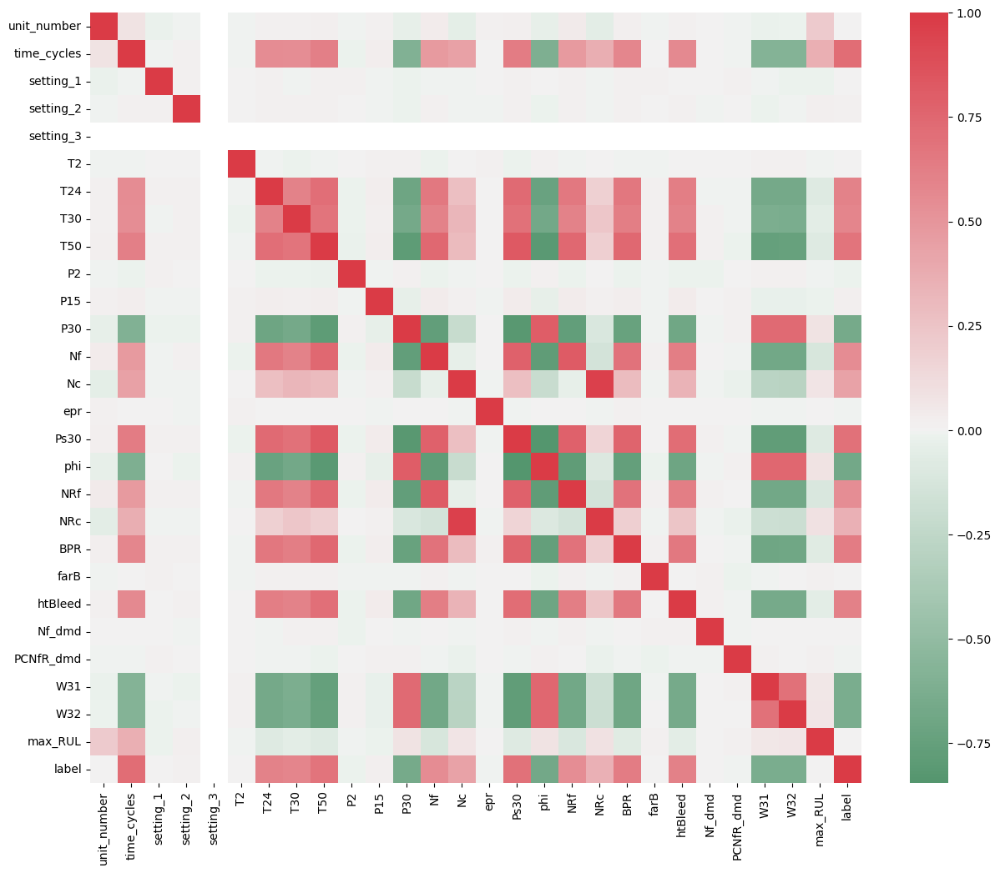

In [ ]:
plt.figure(figsize=(15, 12))
cmap = sns.diverging_palette(500, 10, as_cmap=True)
sns.heatmap(df_train_RUL.corr(), cmap =cmap, center=0, annot=False, square=True);

### Identifying Irrelevant Features

From preliminary analysis, the following features are not relevant for predicting engine failure:
- unit_number → Not dropped (useful for data manipulation)
- time_cycles → Redundant after creation of label column
- setting_1, setting_2, setting_3 → Engine settings, not useful for failure prediction
- T2 (Fan Inlet Temperature) → Low correlation with failure
- P2 (Fan Inlet Pressure) → Low correlation with failure
- P15 (Bypass Duct Pressure) → Low correlation with failure
- epr (Engine Pressure Ratio) → Not contributing to failure prediction
- NRf, NRc (Fan and Core Speeds) → Redundant information
- farB (Fuel-Air Ratio) → Low impact on prediction
- Nf_dmd, PCNfR_dmd → Demand-related variables, not needed
- max_RUL → Only used for label computation, redundant in model training

### Dropping Unnecessary Columns

To reduce feature redundancy and simplify the model, I remove the identified non-contributing columns.

In [ ]:
columns_to_drop=['time_cycles','setting_1','setting_2','setting_3','T2','P2','P15','epr','NRf','NRc','farB','Nf_dmd','PCNfR_dmd','max_RUL']
df_train_drop=df_train_RUL.drop(columns_to_drop,axis=1)

### Pairplot of Remaining Features

To visualize class distributions, I generate pairplots for a subset of engines (unit numbers ≤ 10). This allows us to see how each parameter varies between healthy (Class 0) and failing (Class 1) engines.

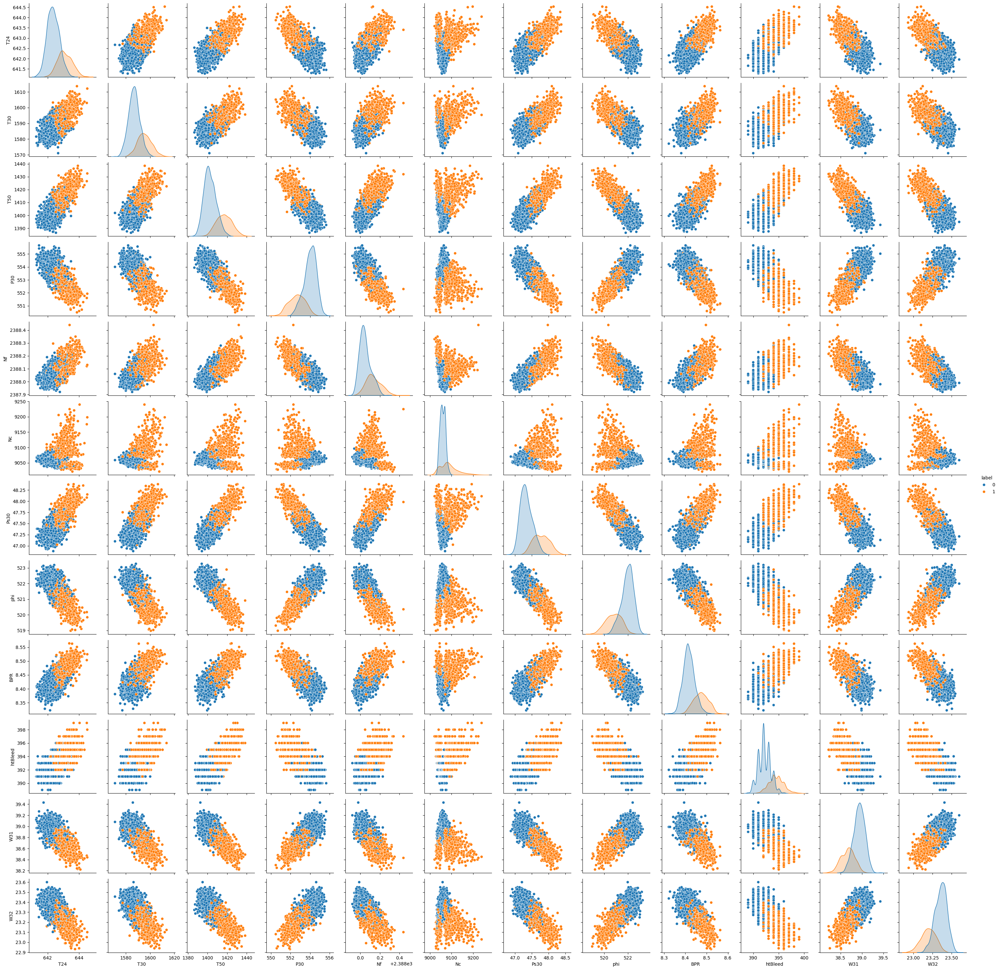

In [ ]:
# Filter dataset for visualization (first 10 engines)
df_filtered = df_train_drop[df_train_drop["unit_number"] <= 10]
# Generate pairplot with class labels
sns.pairplot(df_filtered.drop(['unit_number'], axis=1), hue="label")

## Observation

1. Class Imbalance
 - The dataset is imbalanced, with Class 1 (Failure) having significantly less samples than Class 0 (Good Condition).
 - This can negatively impact the model’s ability to correctly classify the minority class.
 - To address this, I should experiment with resampling techniques, including:
     - SMOTE (Synthetic Minority Over-sampling Technique): Generates synthetic data points for the minority class.
     - Random Over-Sampling: Duplicates samples from the minority class to balance the dataset.
     - Random Under-Sampling: Reduces the number of samples in the majority class.
2. Overlapping Data Near the Class Boundary
 - There is some overlap between the two classes, particularly near the decision boundary.
 - This indicates that engines transition gradually from good condition to failure rather than having a sharp cutoff.
 - The overlap could introduce classification errors, making it harder for the model to learn a clear distinction.
3. Feature Separability
 - Despite the overlap, many features show a clear distinction between the two classes.
 - At least near the decision boundary, the separation is reasonably good, meaning the features contain useful information for classification.
 - Some features demonstrate linear separability, suggesting that a logistic regression or SVM model could work well,

# Definition of the Data Transformation Pipeline

## Handling Missing Values

### Check for Missing Values in Each Feature

First, i analyze how many missing values exist in each feature to determine the appropriate imputation strategy.

In [ ]:
features = list(df_train_drop.columns)
for feature in features:
    print(f'{feature} has {df_train_RUL[feature].isnull().sum()} missing values')

df_train_drop

unit_number has 0 missing values
T24 has 211 missing values
T30 has 196 missing values
T50 has 195 missing values
P30 has 225 missing values
Nf has 198 missing values
Nc has 180 missing values
Ps30 has 197 missing values
phi has 219 missing values
BPR has 203 missing values
htBleed has 219 missing values
W31 has 210 missing values
W32 has 187 missing values
label has 0 missing values


,unit_number,T24,T30,T50,P30,Nf,Nc,Ps30,phi,BPR,htBleed,W31,W32,label
0,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.470000,521.66,8.4195,392.0,39.060000,23.4190,0
1,1,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.490000,522.28,8.4318,392.0,39.000000,23.4236,0
2,1,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.270000,522.42,8.4178,390.0,38.955090,23.3442,0
3,1,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.075904,522.86,8.3682,392.0,38.880798,23.3739,0
4,1,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.280000,522.19,8.4294,393.0,38.900000,23.4044,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,643.49,1597.98,1428.63,551.43,2388.19,9065.52,48.070000,519.49,8.4956,397.0,38.490000,NaN,1
20627,100,643.54,1604.50,1433.58,550.86,2388.23,9065.11,48.040000,519.68,8.5139,395.0,38.300000,23.1594,1
20628,100,643.42,1602.46,1428.18,550.94,2388.24,9065.90,48.090000,520.01,8.5646,398.0,38.440000,22.9333,1
20629,100,643.23,1605.26,1426.53,550.68,2388.25,9073.72,48.390000,519.67,8.5389,395.0,38.290000,23.0640,1


### Missing Value Distribution Across Units

Analyze missing values across all engine units to understand their distribution.

In [ ]:
null_counts_matrix = []
for i in df_train_drop['unit_number'].unique():
    null_counts = df_train_drop[df_train_RUL['unit_number'] == i].isnull().sum(axis=0).values
    null_counts_matrix.append(null_counts)

arr = pd.DataFrame(null_counts_matrix).transpose()

print(f'Max null values: {arr.sum().max()}')
arr.describe()

Max null values: 48


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
count,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,...,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000
mean,1.571429,2.357143,1.571429,1.785714,2.642857,1.571429,1.428571,1.071429,2.000000,2.500000,...,1.285714,2.571429,1.857143,2.928571,2.214286,2.428571,2.428571,1.857143,1.571429,1.785714
std,1.283881,1.736803,1.016350,1.625687,2.205139,1.016350,1.504572,1.141139,1.519109,2.028641,...,1.138729,1.827747,1.406422,2.092635,1.528125,2.101805,1.741542,1.292412,1.398586,1.672335
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,0.250000,1.000000,1.000000,0.250000,0.000000,0.500000,1.250000,...,0.250000,1.250000,1.250000,1.000000,1.250000,0.500000,0.500000,1.000000,0.250000,0.250000
50%,1.000000,2.500000,1.500000,1.500000,2.000000,2.000000,1.000000,1.000000,2.000000,2.000000,...,1.000000,3.000000,2.000000,3.000000,2.500000,2.000000,3.000000,2.000000,1.500000,1.500000
75%,2.750000,4.000000,2.000000,3.000000,4.750000,2.000000,2.000000,1.750000,3.000000,3.750000,...,2.000000,3.750000,2.000000,4.000000,3.000000,3.750000,3.750000,3.000000,2.000000,2.750000
max,4.000000,5.000000,3.000000,5.000000,6.000000,4.000000,5.000000,4.000000,4.000000,7.000000,...,3.000000,5.000000,5.000000,7.000000,5.000000,7.000000,5.000000,4.000000,4.000000,5.000000


### Observation:

 - The maximum number of missing values across the entire lifespan of a unit is 48.
 - Since removing rows with missing values would cause significant data loss, I opted for data imputation instead.

## Custom Transformer for Interpolation

Instead of removing rows, I choose to create a custom transformer that interpolates missing values based on the surrounding data.

In [ ]:
# Custom transformer for interpolation
class InterpolationImputer(BaseEstimator, TransformerMixin):
    def __init__(self, method='linear'):
        self.method = method

    def fit(self, X, y=None):
        return self  # No fitting required for interpolation

    def transform(self, X):
        # Interpolate missing values in each column
        X = pd.DataFrame(X).interpolate(method=self.method, axis=0, limit_direction='both')
        return X.values  # Convert back to numpy array

## Feature Categorization & Standardization Strategy

## Define Column transform

I categorize features into four groups based on their nature and select appropriate transformations.

Feature Type	                        Missing Value Handling	                                      Scaling Method
Temperature & Pressure      Linear Interpolation	                                           StandardScaler
Speed (Nc, Nf)	              Linear Interpolation	                                           StandardScaler
Ratio Features	              Linear Interpolation	                                           StandardScaler
Bleed Parameters	              Median Imputation (due to high variability)	   StandardScaler

In [ ]:
# Categorizing features
temperature_pressure_cols = ['T24', 'T30', 'T50', 'P30', 'Ps30']
speed_cols = ['Nc','Nf']
ratio_cols = ['phi', 'BPR']
bleed_cols = ['htBleed','W31', 'W32']

# create pipeline
pipeline_temp_press = Pipeline([
    ('imputer', InterpolationImputer(method='linear')),
    ('scaler', StandardScaler())])

pipeline_speed = Pipeline([
    ('imputer', InterpolationImputer(method='linear')),
    ('scaler', StandardScaler())])

pipeline_ratio = Pipeline([
    ('imputer', InterpolationImputer(method='linear')),
    ('scaler', StandardScaler())])

pipeline_bleed = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('scaler', StandardScaler())])

# create column transformer
final_transformation = ColumnTransformer([
    ('temp_press', pipeline_temp_press, temperature_pressure_cols),
    ('speed', pipeline_speed, speed_cols),
    ('ratio', pipeline_ratio, ratio_cols),
    ('bleed', pipeline_bleed, bleed_cols)],
    remainder='passthrough', # passthrough for 'RUL'and 'unit_number' column,
    sparse_threshold=0,
    verbose_feature_names_out=False)

### Create all possible parameter confiuration

In [ ]:
# Handling Class Imbalance
imbalanced_config = [
    {
        'sampler': [None]  # No resampling (baseline)
    },
    {
        'sampler': [SMOTE()],
        'sampler__sampling_strategy': ['auto', 0.7, 0.5]
    },
    {
        'sampler': [RandomOverSampler()],
        'sampler__sampling_strategy': ['auto', 0.7]
    },
    {
        'sampler': [RandomUnderSampler()],
        'sampler__sampling_strategy': [0.7, 0.5]
    }
]

# Configurations for dimensionality reduction
dim_reduction_configs = [
    {
        'dim_reduction': [None]  # No reduction (baseline)
    },
    {
        'dim_reduction': [PCA()],
        'dim_reduction__n_components': [0.8, 0.6, 0.5]
    },{
        'dim_reduction': [LDA()]
    }
]

# Configurations for binary classifiers
classifier_configs = [
    {
        'classifier': [LogisticRegression()],
        'classifier__penalty': ['l2'],
    },
    {
        'classifier': [KNeighborsClassifier()],
        'classifier__n_neighbors': [3, 5, 9], 
    },
    {
        'classifier': [RandomForestClassifier(class_weight='balanced')],
        'classifier__n_estimators': [10, 100, 500], 
    },
    {
        'classifier': [LGBMClassifier(objective='binary', verbose=-1)],  
        'classifier__n_estimators': [10, 100, 500]
    },
    {
        'classifier': [XGBClassifier()],
        'classifier__n_estimators': [100, 300, 500],
        'classifier__learning_rate':   loguniform(0.001,100)
    },
    {
        'classifier': [DecisionTreeClassifier()],
        'classifier__criterion': ["gini", "entropy"]
    },
    {
        'classifier': [SVC()],
        'classifier__C': loguniform(0.001,100),
        'classifier__kernel': ['sigmoid', 'rbf', 'linear', 'poly']
    }
]

In [ ]:
all_configs = [dict(itertools.chain(*(e.items() 
for e in configuration))) 
for configuration in 
itertools.product(imbalanced_config,dim_reduction_configs,classifier_configs)]

f'Number of all possible configurations: {len(all_configs)}'

'Number of all possible configurations: 84'

# RandomizedSearchCV with Feature Engineering & Model Selection

In [ ]:
X=df_train_drop.drop(columns=['unit_number','label']) # Features
y=df_train_drop[['label']] # Target variable

In [ ]:
# Split the data into training and test sets
X_train,X_test,y_train,y_test=train_test_split(
    X,
    y,
    random_state=3, # Ensures reproducibility
    shuffle=True,
    stratify=y, # Stratified sampling to maintain class proportions
    test_size=0.2 # 80% training, 20% test
)

In [ ]:
rs = RandomizedSearchCV(
    IMBPipeline([
        ('trans', final_transformation),  # Feature transformation step
        ('sampler', SMOTE(sampling_strategy='auto')),  # Handling class imbalance
        ('dim_reduction', PCA(n_components=0.8)),  # Feature reduction
        ('classifier', LogisticRegression())  
    ]),
    param_distributions=all_configs,  
    n_iter=len(all_configs) * 2,  
    n_jobs=-1,  # Use all available CPUs
    cv=2,  # Cross-validation folds
    scoring='f1', 
    error_score='raise'
)

In [ ]:
models = cross_validate(
    rs,  # Use the best found pipeline
    X_train, y_train,
    cv=5,
    scoring='f1',  # Use standard F1 for binary classification
    return_estimator=True,
    verbose=3,
    error_score='raise'  # Fixed the incorrect 'setting' to 'error_score'
)

[CV] END ......................................., score=0.888 total time= 3.5min
[CV] END ......................................., score=0.888 total time= 4.4min
[CV] END ......................................., score=0.860 total time= 4.0min
[CV] END ......................................., score=0.868 total time= 3.7min
[CV] END ......................................., score=0.864 total time= 4.0min


### Retrieving Parameters

Extracts and prints parameters of the best estimators for each model, including sampler, dim_reduction, and classifier. It also prints the classifier’s parameters and the test score.

In [ ]:
for index, estimator in enumerate(models['estimator']):
    print(estimator.best_estimator_.get_params()['sampler'])
    print(estimator.best_estimator_.get_params()['dim_reduction'])
    print(estimator.best_estimator_.get_params()['classifier'],estimator.best_estimator_.get_params()['classifier'].get_params())
    print(models['test_score'][index])
    print('-'*10)

SMOTE(sampling_strategy=0.7)
None
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.007091202830240014,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) {'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_st

## Model Training and Evaluation

Loop retrains the best estimator on the training set, makes predictions, and computes the F1-score for both training and test sets.

In [ ]:
for estimator in models['estimator']:
    pred_train = estimator.best_estimator_.fit(X_train, y_train)
    pred_train = estimator.best_estimator_.predict(X_train)
    pred_test = estimator.best_estimator_.predict(X_test)
    f1_train = f1_score(y_train, pred_train)
    f1_test = f1_score(y_test, pred_test)
    print(f'F1 on training set:{f1_train}, F1 on test set:{f1_test}')

F1 on training set:0.9013077237433592, F1 on test set:0.8708367181153533
F1 on training set:0.8809069718160627, F1 on test set:0.8759558198810535
F1 on training set:1.0, F1 on test set:0.87248322147651
F1 on training set:1.0, F1 on test set:0.8717525773195877
F1 on training set:1.0, F1 on test set:0.8726823238566132


In [ ]:
models['estimator'][1].best_estimator_

Pipeline(steps=[('trans',
                 ColumnTransformer(remainder='passthrough', sparse_threshold=0,
                                   transformers=[('temp_press',
                                                  Pipeline(steps=[('imputer',
                                                                   InterpolationImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['T24', 'T30', 'T50', 'P30',
                                                   'Ps30']),
                                                 ('speed',
                                                  Pipeline(steps=[('imputer',
                                                                   InterpolationImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Nc', 'Nf']),
                                                 ('ratio',
                                                  Pipeline(steps=[('imputer',
                                                                   InterpolationImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['phi', 'BPR']),
                                                 ('bleed',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['htBleed', 'W31', 'W32'])],
                                   verbose_feature_names_out=False)),
                ('sampler', None), ('dim_reduction', None),
                ('classifier', SVC(C=1.6104031538901578))])

In [ ]:
models['estimator'][0].best_estimator_

Pipeline(steps=[('trans',
                 ColumnTransformer(remainder='passthrough', sparse_threshold=0,
                                   transformers=[('temp_press',
                                                  Pipeline(steps=[('imputer',
                                                                   InterpolationImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['T24', 'T30', 'T50', 'P30',
                                                   'Ps30']),
                                                 ('speed',
                                                  Pipeline(steps=[('imputer',
                                                                   InterpolationImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Nc', 'Nf']),
                                                 ('ratio',
                                                  Pipeline(...
                               importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.007091202830240014, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=None,
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=500,
                               n_jobs=None, num_parallel_tree=None,
                               random_state=None, ...))])

### Observation:

- Overfitting for RandomForestClassifier (F1 = 1.0 on Training, Lower on Test)

- Good Generalizatio Performance for SVC(C=1.6) and for XGBClassifier

## Function for model evaluation

In [ ]:
best_Pipeline=[]

In [ ]:
# create function that evaluate the model and show confusion matrix
def evaluate(X_test,y_test,best_estimator,name):

    y_pred = best_estimator.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    metrics = pd.DataFrame({
        'Metric': ['Accuracy', 'Precision', 'Recall', 'F1', 'ROC AUC'],
        'Value': [accuracy, precision, recall, f1, roc_auc]    
    })
    best_Pipeline.append([name,best_estimator,metrics])
    # Printing the metrics
    display(metrics)

    # since the false negative is important i need to impove Recall

    cm = confusion_matrix(y_test, y_pred)
    labels = ['Good (0)', 'Failure(1)']  # Adjust labels based on your classes

    # Plot confusion matrix
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

## Metrics first search

,Metric,Value
0,Accuracy,0.929246
1,Precision,0.933032
2,Recall,0.825460
3,F1,0.875956
4,ROC AUC,0.899874


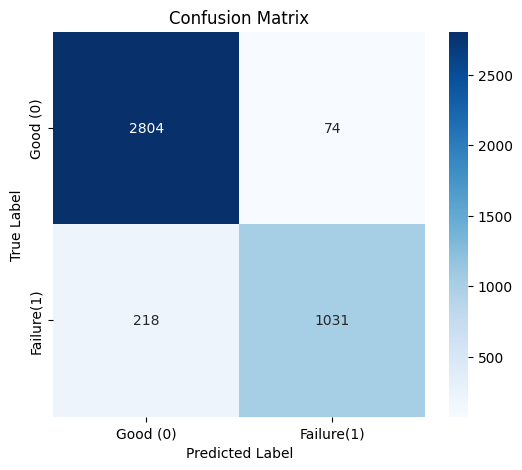

In [ ]:
evaluate(X_test, y_test, models['estimator'][1].best_estimator_, 'svc first search')

### Observation:

High Precision (93.3%) but Lower Recall (82.54%)

- The model is very precise when predicting failures, meaning false positives are low.

- However, the recall is lower, indicating some failures are being missed (false negatives).


Balanced F1-Score (87.59%)

- A good trade-off between precision and recall, but if the cost of missing a failure is high, boosting recall should be prioritized.

# Hyperparameter tuning

This section performs hyperparameter tuning on an SVC model using RandomizedSearchCV and evaluates its performance via 
cross-validation.

In [ ]:
model_pipeline_svc = IMBPipeline([
    ('trans', final_transformation),
    ('classifier',SVC(probability=True,kernel='rbf'))
])

In [ ]:
param_grid_svc = {
    'classifier__C': np.logspace(-3, 3, 10),  # Regolarizzazione
    'classifier__gamma': ['scale',  0.01, 0.1, 1]  # Gamma (usato per rbf e poly)
}

In [ ]:
rs_svc = RandomizedSearchCV(model_pipeline_svc, 
        param_distributions=param_grid_svc, 
        n_iter=len(param_grid_svc) * 2,
        n_jobs=-1,
        cv=2,
        scoring='f1',  # Usa F1 pesato per la multiclasse
        error_score='raise')

In [ ]:
scores_svc = cross_validate(
    rs_svc,  # Use the best found pipeline
    X_train, y_train,
    cv=5,
    scoring='f1',  # Use standard F1 for binary classification
    return_estimator=True,
    verbose=3,
    error_score='raise'  # Fixed the incorrect 'setting' to 'error_score'
)

[CV] END ......................................., score=0.889 total time=  35.0s
[CV] END ......................................., score=0.885 total time=  33.2s
[CV] END ......................................., score=0.859 total time=  44.6s
[CV] END ......................................., score=0.867 total time=  26.6s
[CV] END ......................................., score=0.865 total time=  58.5s


In [ ]:
for index, estimator in enumerate(scores_svc['estimator']):
    print(estimator.best_estimator_.get_params()['classifier'],estimator.best_estimator_.get_params()['classifier'].get_params())
    print(scores_svc['test_score'][index])
    print('-'*10)

SVC(C=2.154434690031882, gamma=0.1, probability=True) {'C': 2.154434690031882, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 0.1, 'kernel': 'rbf', 'max_iter': -1, 'probability': True, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}
0.8892405063291139
----------
SVC(C=46.41588833612773, gamma=0.01, probability=True) {'C': 46.41588833612773, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 0.01, 'kernel': 'rbf', 'max_iter': -1, 'probability': True, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}
0.8847352024922118
----------
SVC(C=0.4641588833612777, gamma=0.1, probability=True) {'C': 0.4641588833612777, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 0.1, 'kernel': 'rbf', 'max_iter': -1, '

In [ ]:
for estimator in scores_svc['estimator']:
    pred_train = estimator.best_estimator_.fit(X_train, y_train)
    pred_train = estimator.best_estimator_.predict(X_train)
    pred_test = estimator.best_estimator_.predict(X_test)
    f1_train = f1_score(y_train, pred_train)
    f1_test = f1_score(y_test, pred_test)
    print(f'F1 on training set:{f1_train}, F1 on test set:{f1_test}')

F1 on training set:0.8835290384005078, F1 on test set:0.876537971998303
F1 on training set:0.8767414654897373, F1 on test set:0.8762798634812287
F1 on training set:0.8784413384159254, F1 on test set:0.8753721820501914
F1 on training set:0.874410809678433, F1 on test set:0.8746846089150546
F1 on training set:0.8835290384005078, F1 on test set:0.876537971998303


,Metric,Value
0,Accuracy,0.929731
1,Precision,0.937900
2,Recall,0.822258
3,F1,0.876280
4,ROC AUC,0.899315


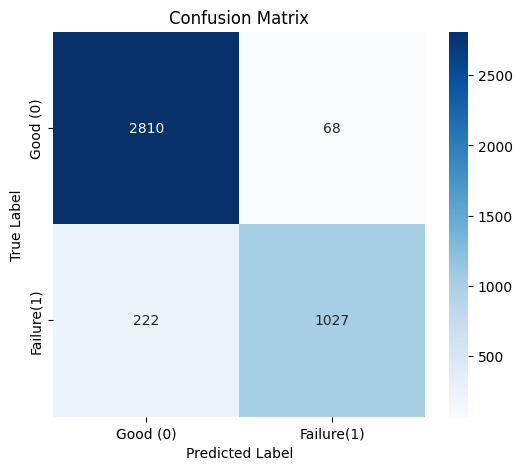

In [ ]:
evaluate(X_test,y_test,scores_svc['estimator'][1].best_estimator_,'svc optimization')

### Comparison with Previous Results

- Key Metrics:
Accuracy: 92.9% → Slightly higher than previous models.
Precision: 93.7% → The proportion of correctly predicted failures remains strong.
Recall: 82.2% → Improved recall compared to the SVC model, meaning fewer false negatives.
F1-Score: 87.6% → A balance between precision and recall, showing good overall performance.
ROC AUC: 89.9% → Strong capability of distinguishing between the two classes.

# Boosting

## Hyperparameter Tuning for XGBoost

This section fine-tunes an XGBoost classifier using RandomizedSearchCV while addressing class imbalance with SMOTE. consistent data transformation, resampling, and model training.

In [ ]:
model_pipeline_xbgc = IMBPipeline([
    ('trans', final_transformation),
    ('sampler', SMOTE(sampling_strategy=0.7)),
    ('dim_reduction', None),
    ('classifier',XGBClassifier())
])

param_grid_xbgc = {
    'classifier__n_estimators': [50, 100, 150,200],  
    'classifier__learning_rate': [0.001,0.01,0.05,0.1,0.5,0.9],  
    'classifier__max_depth': [5,20,40,100] 
}
rs_xbgc = RandomizedSearchCV(model_pipeline_xbgc, 
        param_distributions=param_grid_xbgc, 
        n_iter=len(param_grid_xbgc) * 2,
        n_jobs=-1,
        cv=2,
        scoring='f1',  # Usa F1 pesato per la multiclasse
        error_score='raise')

scores_xbgc = cross_validate(
    rs_xbgc,  # Use the best found pipeline
    X_train, y_train,
    cv=5,
    scoring='f1',  # Use standard F1 for binary classification
    return_estimator=True,
    verbose=3,
    error_score='raise'  # Fixed the incorrect 'setting' to 'error_score'
)

[CV] END ......................................., score=0.887 total time=  15.8s
[CV] END ......................................., score=0.883 total time=  10.6s
[CV] END ......................................., score=0.858 total time=   5.4s
[CV] END ......................................., score=0.871 total time=   5.3s
[CV] END ......................................., score=0.858 total time=   9.0s


In [ ]:
for index, estimator in enumerate(scores_xbgc['estimator']):
    print(estimator.best_estimator_.get_params()['sampler'])
    print(estimator.best_estimator_.get_params()['classifier'],estimator.best_estimator_.get_params()['classifier'].get_params())
    print(scores_xbgc['test_score'][index])
    print('-'*10)

SMOTE(sampling_strategy=0.7)
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...) {'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'e

In [ ]:
for estimator in scores_xbgc['estimator']:
    pred_train = estimator.best_estimator_.fit(X_train, y_train)
    pred_train = estimator.best_estimator_.predict(X_train)
    pred_test = estimator.best_estimator_.predict(X_test)
    f1_train = f1_score(y_train, pred_train)
    f1_test = f1_score(y_test, pred_test)
    print(f'F1 on training set:{f1_train}, F1 on test set:{f1_test}')

F1 on training set:0.9045828675947566, F1 on test set:0.8762214983713354
F1 on training set:0.8964467005076142, F1 on test set:0.8707592891760905
F1 on training set:0.889756498510223, F1 on test set:0.8639344262295082
F1 on training set:0.9046116257762394, F1 on test set:0.8743882544861338
F1 on training set:0.8859004861901314, F1 on test set:0.8626964433416047


,Metric,Value
0,Accuracy,0.922462
1,Precision,0.878566
2,Recall,0.863090
3,F1,0.870759
4,ROC AUC,0.905659


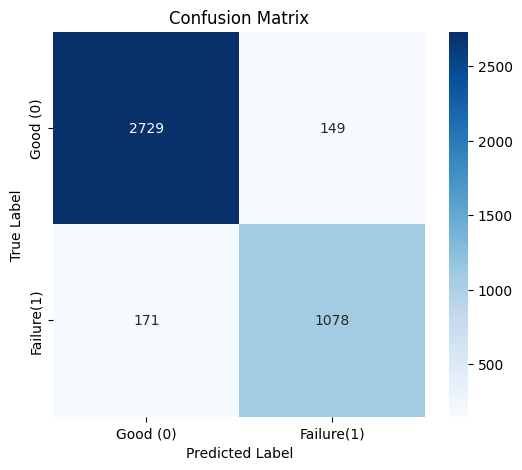

In [ ]:
evaluate(X_test,y_test,scores_xbgc['estimator'][1].best_estimator_,'xgboost optimization')

### Comparison with Previous Results

- Key Metrics:
Accuracy: 92.2% → Slightly lower than previous models.
Precision: 87.8% → The proportion of correctly predicted failures remains strong.
Recall: 86.3% → Improved recall compared to the SVC model, meaning fewer false negatives.
F1-Score: 87.01% → A balance between precision and recall, showing good overall performance.
ROC AUC: 90.06% → Strong capability of distinguishing between the two classes.

## LGBM Classifier

This section fine-tunes an LGBMClassifierclassifier using RandomizedSearchCV.

In [ ]:
model_pipeline_lgbm = IMBPipeline([
    ('trans', final_transformation),
    ('classifier', LGBMClassifier())
])

param_grid_lgbm = {
    'classifier__n_estimators': [50, 100, 150, 200],
    'classifier__learning_rate': [0.001, 0.01, 0.05, 0.1, 0.5, 0.9],
    'classifier__max_depth': [5, 20, 40, 100]
}

# Randomized Search
rs_lgbm = RandomizedSearchCV(
    model_pipeline_lgbm,
    param_distributions=param_grid_lgbm,
    n_iter=len(param_grid_lgbm) * 2,
    n_jobs=-1,
    cv=2,
    scoring='f1',
    error_score='raise'
)

# Cross-validation
scores_lgbm = cross_validate(
    rs_lgbm,
    X_train, y_train,
    cv=5,
    scoring='f1',
    return_estimator=True,
    verbose=3,
    error_score='raise'
)

[CV] END ......................................., score=0.891 total time=   3.2s
[CV] END ......................................., score=0.885 total time=   3.8s
[CV] END ......................................., score=0.864 total time=   3.2s
[CV] END ......................................., score=0.869 total time=   2.9s
[CV] END ......................................., score=0.858 total time=   3.7s


In [ ]:
for index, estimator in enumerate(scores_lgbm['estimator']):
    print(estimator.best_estimator_.get_params()['classifier'],estimator.best_estimator_.get_params()['classifier'].get_params())
    print(scores_lgbm['test_score'][index])
    print('-'*10)

LGBMClassifier(learning_rate=0.05, max_depth=20) {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.05, 'max_depth': 20, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': None, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0}
0.8905033731188375
----------
LGBMClassifier(max_depth=5, n_estimators=150) {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': 5, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 150, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': None, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0}
0.8851626016260162
----------
LGBMClassifie

In [ ]:
for estimator in scores_lgbm['estimator']:
    pred_train = estimator.best_estimator_.fit(X_train, y_train)
    pred_train = estimator.best_estimator_.predict(X_train)
    pred_test = estimator.best_estimator_.predict(X_test)
    f1_train = f1_score(y_train, pred_train)
    f1_test = f1_score(y_test, pred_test)
    print(f'F1 on training set:{f1_train}, F1 on test set:{f1_test}')

F1 on training set:0.9073130136273796, F1 on test set:0.8716666666666667
F1 on training set:0.9171362972239616, F1 on test set:0.8742714404662781
F1 on training set:0.9071756362119315, F1 on test set:0.8717091516924362
F1 on training set:0.8973742023224187, F1 on test set:0.8701461377870564
F1 on training set:0.9688779688779688, F1 on test set:0.8694929343308395


,Metric,Value
0,Accuracy,0.924643
1,Precision,0.909250
2,Recall,0.834267
3,F1,0.870146
4,ROC AUC,0.899066


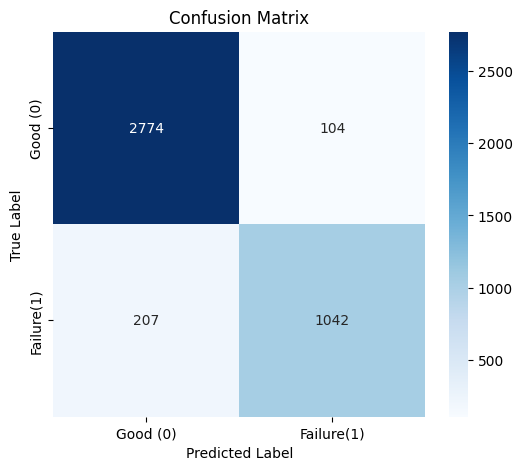

In [ ]:
evaluate(X_test,y_test,scores_lgbm['estimator'][3].best_estimator_,'lgdm')

### Comparison with Previous Results

- Key Metrics:
Accuracy: 92.46% → Slightly higher than XGBoost models.
Precision: 90.9% → Higher than XGBoost models.
Recall: 83.4% → Slightly Lower Recall.
F1-Score: 87.01% → The trade-off between precision and recall is slightly better than in the previous XGBoost model.
ROC AUC: 89.9% → slightly better ability to distinguish between Good and Failure instances.

## Cat boost classifier

This section fine-tunes an CatBoostClassifierusing RandomizedSearchCV.

In [ ]:
model_pipeline_cat = IMBPipeline([
    ('trans', final_transformation),
    ('classifier', CatBoostClassifier(verbose=0))
])

# Updated griglia di iperparametri per CatBoost (depth max 16)
param_grid_cat = {
    'classifier__iterations': [50, 100, 150, 200],
    'classifier__learning_rate': [0.001, 0.01, 0.1, 0.9],
    'classifier__depth': [4, 6, 8, 12]  # Maximum depth set to 16
}

# Randomized Search
rs_cat = RandomizedSearchCV(
    model_pipeline_cat,
    param_distributions=param_grid_cat,
    n_iter = min(30, len(param_grid_cat)),  # Limit to 30 iterations
    n_jobs=-1,
    cv=2,
    scoring='f1',
    error_score='raise'
)

# Cross-validation
scores_cat = cross_validate(
    rs_cat,
    X_train, y_train,
    cv=5,
    scoring='f1',
    return_estimator=True,
    verbose=3,
    error_score='raise'
)

[CV] END ......................................., score=0.893 total time=  51.5s
[CV] END ......................................., score=0.884 total time=  39.8s
[CV] END ......................................., score=0.855 total time=  12.7s
[CV] END ......................................., score=0.859 total time=  19.5s
[CV] END ......................................., score=0.868 total time=  16.3s


In [ ]:
for index, estimator in enumerate(scores_cat['estimator']):
    print(estimator.best_estimator_.get_params()['classifier'],estimator.best_estimator_.get_params()['classifier'].get_params())
    print(scores_cat['test_score'][index])
    print('-'*10)

<catboost.core.CatBoostClassifier object at 0x7fd9da632770> {'verbose': 0, 'learning_rate': 0.1, 'iterations': 100, 'depth': 12}
0.8929313929313929
----------
<catboost.core.CatBoostClassifier object at 0x7fd9df10e860> {'verbose': 0, 'learning_rate': 0.01, 'iterations': 200, 'depth': 6}
0.8842975206611571
----------
<catboost.core.CatBoostClassifier object at 0x7fd9d91ffc70> {'verbose': 0, 'learning_rate': 0.01, 'iterations': 100, 'depth': 6}
0.8554790894653256
----------
<catboost.core.CatBoostClassifier object at 0x7fd9dd0fc670> {'verbose': 0, 'learning_rate': 0.001, 'iterations': 200, 'depth': 8}
0.8589607635206787
----------
<catboost.core.CatBoostClassifier object at 0x7fd9dd241660> {'verbose': 0, 'learning_rate': 0.1, 'iterations': 100, 'depth': 4}
0.8681029952706253
----------


In [ ]:
for estimator in scores_cat['estimator']:
    pred_train = estimator.best_estimator_.fit(X_train, y_train)
    pred_train = estimator.best_estimator_.predict(X_train)
    pred_test = estimator.best_estimator_.predict(X_test)
    f1_train = f1_score(y_train, pred_train)
    f1_test = f1_score(y_test, pred_test)
    print(f'F1 on training set:{f1_train}, F1 on test set:{f1_test}')

F1 on training set:0.9261605566517811, F1 on test set:0.873015873015873
F1 on training set:0.8801009676062264, F1 on test set:0.8747884940778342
F1 on training set:0.8696388859472626, F1 on test set:0.867316659601526
F1 on training set:0.8738357324301439, F1 on test set:0.8679085520745131
F1 on training set:0.8798502028503069, F1 on test set:0.8771345272802998


,Metric,Value
0,Accuracy,0.928520
1,Precision,0.914062
2,Recall,0.843074
3,F1,0.877135
4,ROC AUC,0.904338


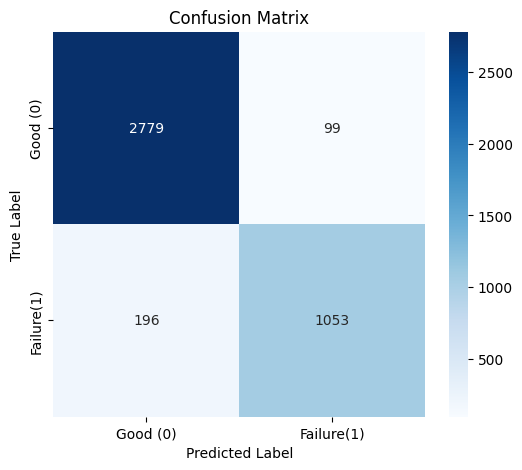

In [ ]:
evaluate(X_test,y_test,scores_cat['estimator'][4].best_estimator_,'cat boost')

### Comparison with Previous Results

- Key Metrics:
Accuracy: 92.8% → Higher than previous models, indicating strong overall classification performance.
Precision: 91.4% → The highest precision among models, reducing false positives.
Recall: 84.31% → Slightly lower recall, meaning a few more failures are missed.
F1-Score: 87.7% → Best balance between precision and recall, outperforming previous models.
ROC AUC: 90.4% → Strong ability to distinguish between Good and Failure instances.

# Voting

Implementing a Voting Classifier using XGBoost, LightGBM, and CatBoost.
Soft voting is used to average predicted probabilities for better performance.
Each model is selected based on the best hyperparameter tuning from previous training.

In [ ]:
#get best model
best_xgb = scores_xbgc['estimator'][1].best_estimator_
best_lgbm = scores_lgbm['estimator'][3].best_estimator_
best_cat = scores_cat['estimator'][4].best_estimator_

In [ ]:
voting_clf = VotingClassifier(
    estimators=[
        ('xgb', best_xgb),
        ('lgbm', best_lgbm),
        ('cat', best_cat)
    ],
    voting='soft'
)

voting_clf.fit(X_train, y_train)

VotingClassifier(estimators=[('xgb',
                              Pipeline(steps=[('trans',
                                               ColumnTransformer(remainder='passthrough',
                                                                 sparse_threshold=0,
                                                                 transformers=[('temp_press',
                                                                                Pipeline(steps=[('imputer',
                                                                                                 InterpolationImputer()),
                                                                                                ('scaler',
                                                                                                 StandardScaler())]),
                                                                                ['T24',
                                                                                 'T30',
                                                                                 'T50',
                                                                                 'P30',
                                                                                 'Ps30']),
                                                                               ('speed',
                                                                                Pipeline(steps=[('imputer',
                                                                                                 InterpolationImputer()),
                                                                                                ('scaler',
                                                                                                 StandardScaler(...
                                                                                Pipeline(steps=[('imputer',
                                                                                                 InterpolationImputer()),
                                                                                                ('scaler',
                                                                                                 StandardScaler())]),
                                                                                ['phi',
                                                                                 'BPR']),
                                                                               ('bleed',
                                                                                Pipeline(steps=[('imputer',
                                                                                                 SimpleImputer(strategy='most_frequent')),
                                                                                                ('scaler',
                                                                                                 StandardScaler())]),
                                                                                ['htBleed',
                                                                                 'W31',
                                                                                 'W32'])],
                                                                 verbose_feature_names_out=False)),
                                              ('classifier',
                                               <catboost.core.CatBoostClassifier object at 0x7fd9dd241660>)]))],
                 voting='soft')

,Metric,Value
0,Accuracy,0.927550
1,Precision,0.909483
2,Recall,0.844676
3,F1,0.875882
4,ROC AUC,0.904096


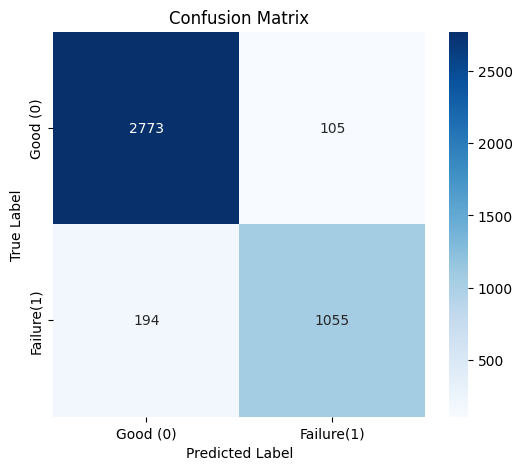

In [ ]:
evaluate(X_test,y_test,voting_clf,'voting')

### Comparison with Previous Results

- Key Metrics:
Accuracy: 92.75% → Slightly lower than CatBoost but still strong overall classification performance.
Precision: 90.09% → Slightly lower than CatBoost but higher than XGBoost and LightGBM.
Recall: 84.47% → Same as CatBoost, meaning the model captures failures at a similar rate.
F1-Score: 87.59% → Slightly lower than CatBoost but still maintains a good balance between precision and recall.
ROC AUC: 90.41% → Strong ability to distinguish between Good and Failure instances.

# Conclusion

In this project, i systematically trained and evaluated multiple machine learning models to identify the best-performing one for our application. I tested a variety of models, including Support Vector Classifiers (SVC), XGBoost, LightGBM, CatBoost, and a Voting Classifier that combined multiple models for enhanced performance.

Through rigorous hyperparameter tuning and cross-validation, I assessed each model based on key metrics such as Accuracy, Precision, Recall, F1-score, and ROC AUC. Each model exhibited unique strengths and trade-offs, allowing us to compare their effectiveness in different scenarios.

I will examine key metrics (Accuracy, Precision, Recall, F1-score, and ROC AUC) in detail to determine which model offers the best balance between reducing false positives and false negatives. This analysis will help us select the most suitable model for our operational needs and project requirements.

Let’s proceed with the comparative analysis!

                  Model  Accuracy  Precision    Recall  F1-Score   ROC AUC
0      svc first search  0.929246   0.933032  0.825460  0.875956  0.899874
1      svc optimization  0.929731   0.937900  0.822258  0.876280  0.899315
2  xgboost optimization  0.922462   0.878566  0.863090  0.870759  0.905659
3                  lgdm  0.924643   0.909250  0.834267  0.870146  0.899066
4             cat boost  0.928520   0.914062  0.843074  0.877135  0.904338
5                voting  0.927550   0.909483  0.844676  0.875882  0.904096


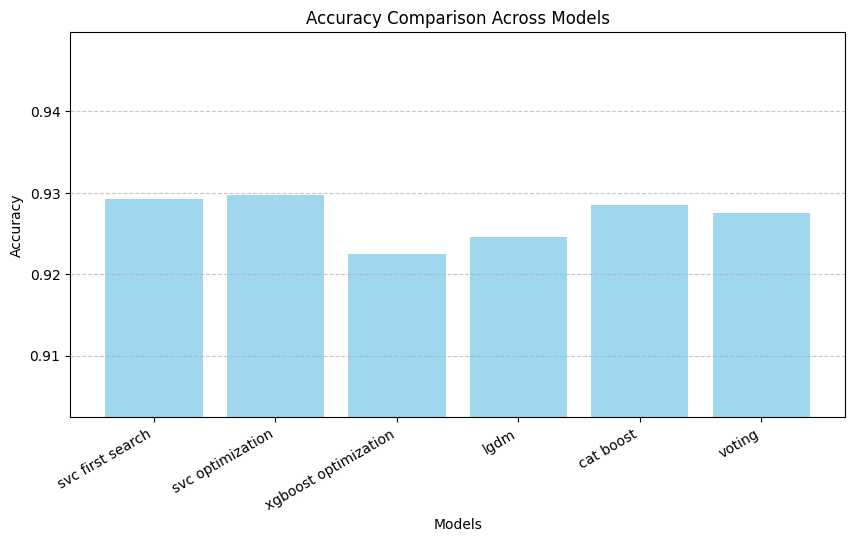

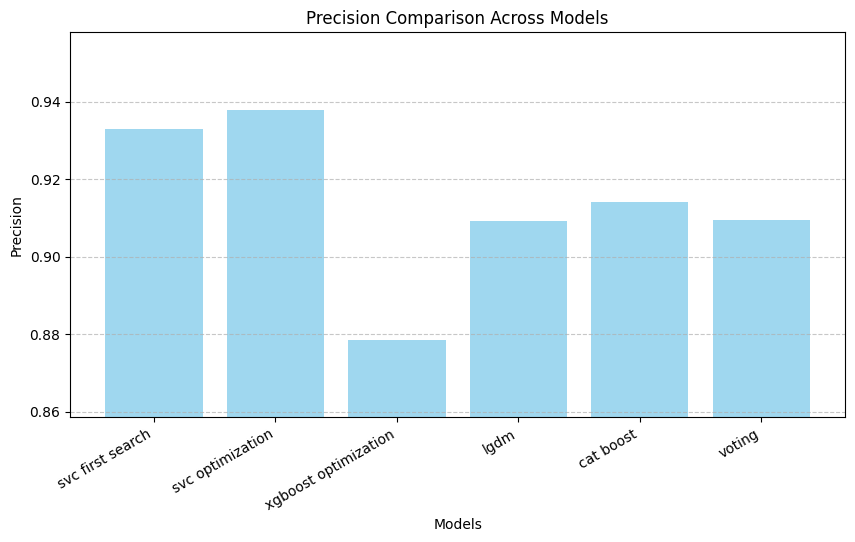

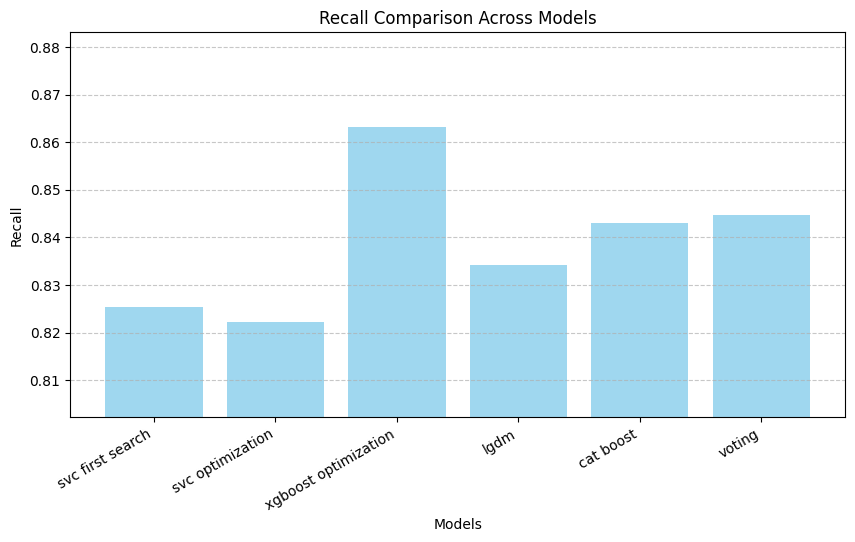

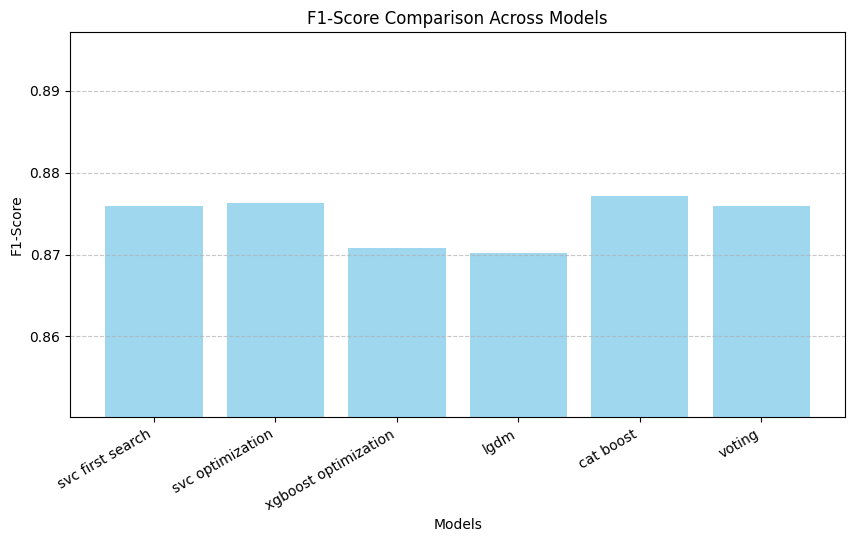

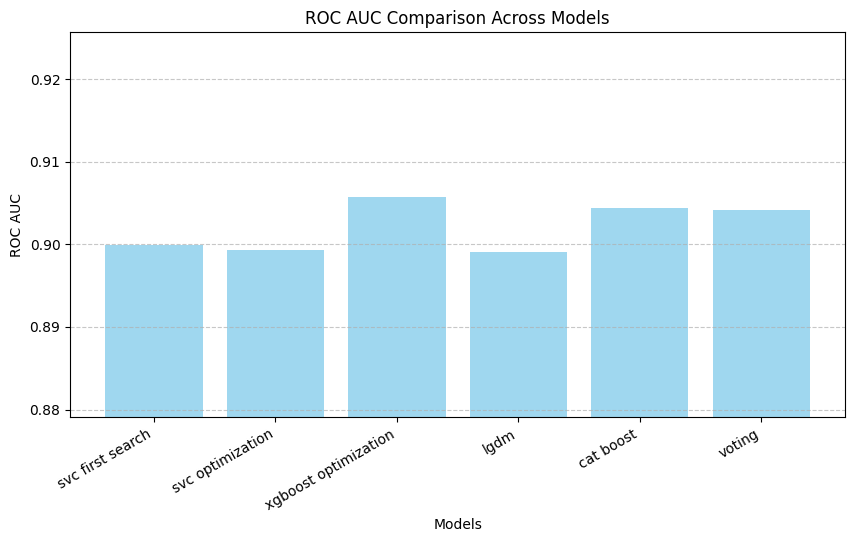

In [ ]:
# Extracting metrics dynamically from the provided list `best_Pipeline`
model_names = []
accuracy = []
precision = []
recall = []
f1_score = []
roc_auc = []

# Loop through the list and extract metrics
for model in best_Pipeline:
    model_names.append(model[0])  # Model name
    metrics_df = model[2]  # The DataFrame containing the metrics

    # Append metrics dynamically
    accuracy.append(metrics_df.loc[metrics_df['Metric'] == 'Accuracy', 'Value'].values[0])
    precision.append(metrics_df.loc[metrics_df['Metric'] == 'Precision', 'Value'].values[0])
    recall.append(metrics_df.loc[metrics_df['Metric'] == 'Recall', 'Value'].values[0])
    f1_score.append(metrics_df.loc[metrics_df['Metric'] == 'F1', 'Value'].values[0])
    roc_auc.append(metrics_df.loc[metrics_df['Metric'] == 'ROC AUC', 'Value'].values[0])

# Creating a DataFrame for visualization
df_metrics_dynamic = pd.DataFrame({
    "Model": model_names,
    "Accuracy": accuracy,
    "Precision": precision,
    "Recall": recall,
    "F1-Score": f1_score,
    "ROC AUC": roc_auc
})

# Display the table
print(df_metrics_dynamic)

# Plot the metrics dynamically
metrics = ["Accuracy", "Precision", "Recall", "F1-Score", "ROC AUC"]

for metric in metrics:
    plt.figure(figsize=(10, 5))
    plt.bar(df_metrics_dynamic["Model"], df_metrics_dynamic[metric], color='skyblue', alpha=0.8)
    plt.xlabel("Models")
    plt.ylabel(metric)
    plt.title(f"{metric} Comparison Across Models")
    plt.ylim([df_metrics_dynamic[metric].min() - 0.02, df_metrics_dynamic[metric].max() + 0.02])
    plt.xticks(rotation=30, ha="right")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


For our application, the most suitable model is the one that minimizes the number of instances incorrectly classified as "Good" (0) when they are actually "Failure" (1). This means that the key criterion is recall, which measures the model's ability to correctly identify as many actual failures as possible.

For this reason, the best model is the Voting Classifier, which achieves a recall of 84.4%, ensuring a more reliable and effective failure detection system while reducing the risk of undetected issues.

In [ ]:
best_model= best_Pipeline[5][1]
best_model

VotingClassifier(estimators=[('xgb',
                              Pipeline(steps=[('trans',
                                               ColumnTransformer(remainder='passthrough',
                                                                 sparse_threshold=0,
                                                                 transformers=[('temp_press',
                                                                                Pipeline(steps=[('imputer',
                                                                                                 InterpolationImputer()),
                                                                                                ('scaler',
                                                                                                 StandardScaler())]),
                                                                                ['T24',
                                                                                 'T30',
                                                                                 'T50',
                                                                                 'P30',
                                                                                 'Ps30']),
                                                                               ('speed',
                                                                                Pipeline(steps=[('imputer',
                                                                                                 InterpolationImputer()),
                                                                                                ('scaler',
                                                                                                 StandardScaler(...
                                                                                Pipeline(steps=[('imputer',
                                                                                                 InterpolationImputer()),
                                                                                                ('scaler',
                                                                                                 StandardScaler())]),
                                                                                ['phi',
                                                                                 'BPR']),
                                                                               ('bleed',
                                                                                Pipeline(steps=[('imputer',
                                                                                                 SimpleImputer(strategy='most_frequent')),
                                                                                                ('scaler',
                                                                                                 StandardScaler())]),
                                                                                ['htBleed',
                                                                                 'W31',
                                                                                 'W32'])],
                                                                 verbose_feature_names_out=False)),
                                              ('classifier',
                                               <catboost.core.CatBoostClassifier object at 0x7fd9dd241660>)]))],
                 voting='soft')

## Learning curve

Now, we can visualize the learning curve to assess the bias-variance trade-off. These curve will help us quantify how the model's performance evolves as a function of the training set size.

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(best_model,
                                                       X=X_train,
                                                       y=y_train,
                                                       train_sizes= [ 0.2,  0.4, 0.6, 0.8, 1.0],
                                                       cv = 5,
                                                       n_jobs = -1,
                                                       scoring = 'recall',
                                                       shuffle = False)

(0.6, 1.03)

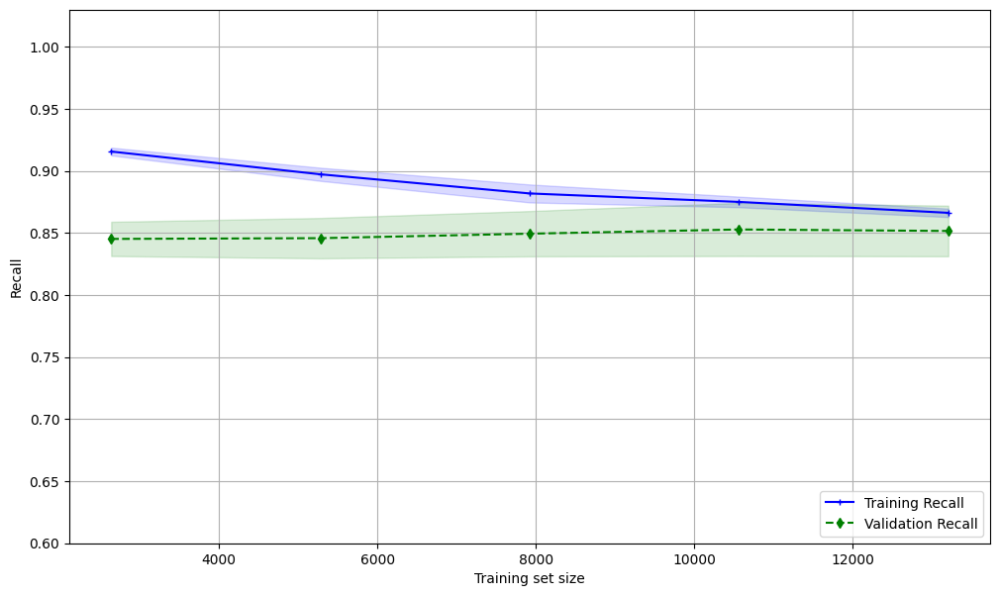

In [ ]:
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

fig=plt.figure(figsize=(12,7))
ax = fig.add_subplot()

ax.plot(train_sizes, train_mean,
         color='blue', marker='+',
         markersize=5, label='Training Recall')

ax.fill_between(train_sizes,
                 train_mean + train_std,
                 train_mean - train_std,
                 alpha=0.15, color='blue')

ax.plot(train_sizes, test_mean,
         color='green', linestyle='--',
         marker='d', markersize=5,
         label='Validation Recall')

ax.fill_between(train_sizes,
                 test_mean + test_std,
                 test_mean - test_std,
                 alpha=0.15, color='green')

ax.grid()
ax.set_xlabel('Training set size')
ax.set_ylabel('Recall')
ax.legend(loc='lower right')
ax.set_ylim([0.60, 1.03])

For the learing curve we can conclude that:

- The model is performing well, but recall is not improving much with more data.

- Mild overfitting exists, but it is not drastic, so reducing complexity may not be necessary.

### Possible Improvements for the Model

- Apply regularization techniques in XGBoost (increasing lambda or alpha).

- Adjust weighting in the Voting Classifier to give more importance to models that perform better on recall.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=bd4bdbed-56c1-43d1-acfe-22738017eef6' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>